# Number Plate Detection using Neural Networks

In this project, we are supposed to detect the number plates on vehicles to obtain their registration numbers.Neural Networks are used for this purpose. 

# Importing Required Libraries

Importing all the necessary libraries required.

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import urllib
import cv2
import os
from lxml import etree

from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from keras.applications.vgg16 import VGG16
from keras.layers import Flatten,Dense,Conv2D,MaxPooling2D
from keras.models import Model,Sequential

# Importing dataset 

Defining the image size and importing the image dataset.

In [5]:
IMAGE_SIZE=224

In [6]:
datadir="C:/Users/dvsam/AIDA/carplates/images"
path=os.path.join(datadir)
X=[]
for img in os.listdir(path):
    img=cv2.imread(os.path.join(path,img))
    img=cv2.resize(img,(IMAGE_SIZE,IMAGE_SIZE))
    X.append(np.array(img))
    

In [7]:
def resizeannotation(f):
    tree = etree.parse(f)
    for dim in tree.xpath("size"):
        width = int(dim.xpath("width")[0].text)
        height = int(dim.xpath("height")[0].text)
    for dim in tree.xpath("object/bndbox"):
        xmin = int(dim.xpath("xmin")[0].text)/(width/IMAGE_SIZE)
        ymin = int(dim.xpath("ymin")[0].text)/(height/IMAGE_SIZE)
        xmax = int(dim.xpath("xmax")[0].text)/(width/IMAGE_SIZE)
        ymax = int(dim.xpath("ymax")[0].text)/(height/IMAGE_SIZE)
    return [int(xmax), int(ymax), int(xmin), int(ymin)]


In [8]:
path='C:/Users/dvsam/AIDA/carplates/annotations'
text_files = ['C:/Users/dvsam/AIDA/carplates/annotations/'+f for f in sorted(os.listdir(path))]
y=[]
for i in text_files:
    y.append(resizeannotation(i))

In [9]:
resizeannotation("C:/Users/dvsam/AIDA/carplates/annotations/Cars0.xml")

[187, 144, 101, 104]

# Data Preprocessing

Images in the dataset are plotted and split for training and testing purposes.

In [10]:
np.array(X).shape,np.array(y).shape

((433, 224, 224, 3), (433, 4))

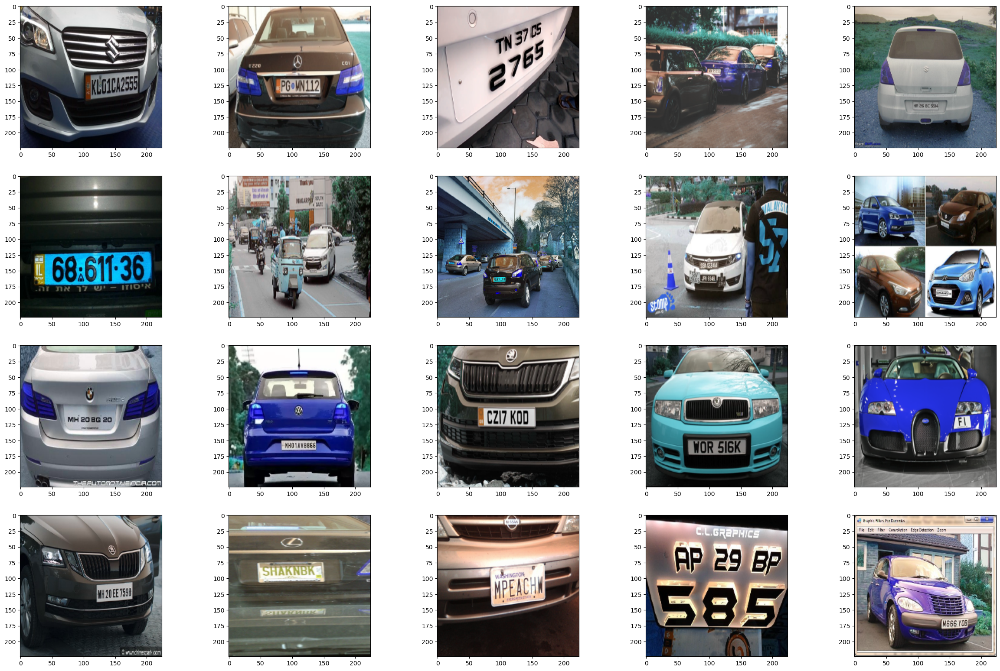

In [11]:
plt.figure(figsize=(30,50))
for i in range(0,20):
    plt.subplot(10,5,i+1)
    plt.imshow(X[i])

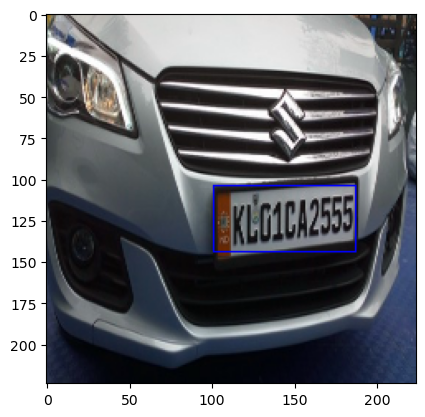

In [12]:
image=cv2.rectangle(X[0],(y[0][0],y[0][1]),(y[0][2],y[0][3]),(0,0,255))
plt.imshow(image)
plt.show()

In [13]:
X=np.array(X)
y=np.array(y)


X=X/255
y=y/255

In [14]:
Xtrain,Xtest,ytrain,ytest=train_test_split(X,y,test_size=0.2,random_state=42)
Xtrain, Xval, ytrain, yval = train_test_split(Xtrain, ytrain, test_size=0.1, random_state=1)

# Defining Model

We define the model to be used for detection. The model used is VGG-16.

In [15]:
model=Sequential()
model.add(VGG16(weights="imagenet",include_top=False,input_shape=(IMAGE_SIZE,IMAGE_SIZE,3)))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="sigmoid"))
model.layers[-6].trainable = False
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 128)               3211392   
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 4)                 260       
                                                                 
Total params: 17951108 (68.48 MB)
Trainable params: 3236

In [16]:
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])

In [19]:
training=model.fit(Xtrain,ytrain,validation_data=(Xval,yval),epochs=50,batch_size=32)

Epoch 1/50
10/10 [==============================] - 57s 6s/step - loss: 5.5118e-04 - accuracy: 0.9293 - val_loss: 0.0144 - val_accuracy: 0.8000
Epoch 2/50
10/10 [==============================] - 54s 5s/step - loss: 5.7300e-04 - accuracy: 0.9196 - val_loss: 0.0143 - val_accuracy: 0.6857
Epoch 3/50
10/10 [==============================] - 55s 6s/step - loss: 5.2874e-04 - accuracy: 0.9582 - val_loss: 0.0150 - val_accuracy: 0.7714
Epoch 4/50
10/10 [==============================] - 56s 6s/step - loss: 5.4293e-04 - accuracy: 0.9421 - val_loss: 0.0145 - val_accuracy: 0.7714
Epoch 5/50
10/10 [==============================] - 57s 6s/step - loss: 4.2976e-04 - accuracy: 0.9260 - val_loss: 0.0146 - val_accuracy: 0.7714
Epoch 6/50
10/10 [==============================] - 58s 6s/step - loss: 3.8652e-04 - accuracy: 0.9486 - val_loss: 0.0144 - val_accuracy: 0.7714
Epoch 7/50
10/10 [==============================] - 58s 6s/step - loss: 4.6074e-04 - accuracy: 0.9486 - val_loss: 0.0146 - val_accuracy:

# Model evaluation

Now the model trained is evaluated and the scores are plotted.

In [27]:
scores=model.evaluate(Xtest,ytest,verbose=0)
print("Accuracy:",(scores[1]*100))

Accuracy: 71.26436829566956


In [28]:
def plotscore(train):
    accuracy=train.history['accuracy']
    valaccuracy=train.history['val_accuracy']
    epochs=range(len(accuracy))
    plt.plot(epochs,accuracy,'b',label='Training Score')
    plt.plot(epochs,valaccuracy,'r',label='Validation Score')
    plt.title('Comparison of Scores')
    plt.legend()
    plt.show()

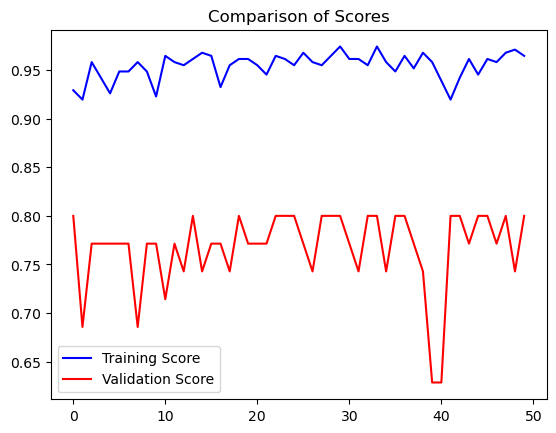

In [29]:
plotscore(training)

In [30]:
testloss,testaccuracy=model.evaluate(Xtest,ytest)
print("Loss:",testloss,'\n Accuracy:',testaccuracy)

3/3 [==============================] - 14s 4s/step - loss: 0.0499 - accuracy: 0.7126
Loss: 0.04994659870862961 
 Accuracy: 0.7126436829566956


# Making predictions

Finally, the model detects the number plates to obtain their registration number.


In [31]:
ypred=model.predict(Xtest)

3/3 [==============================] - 14s 5s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

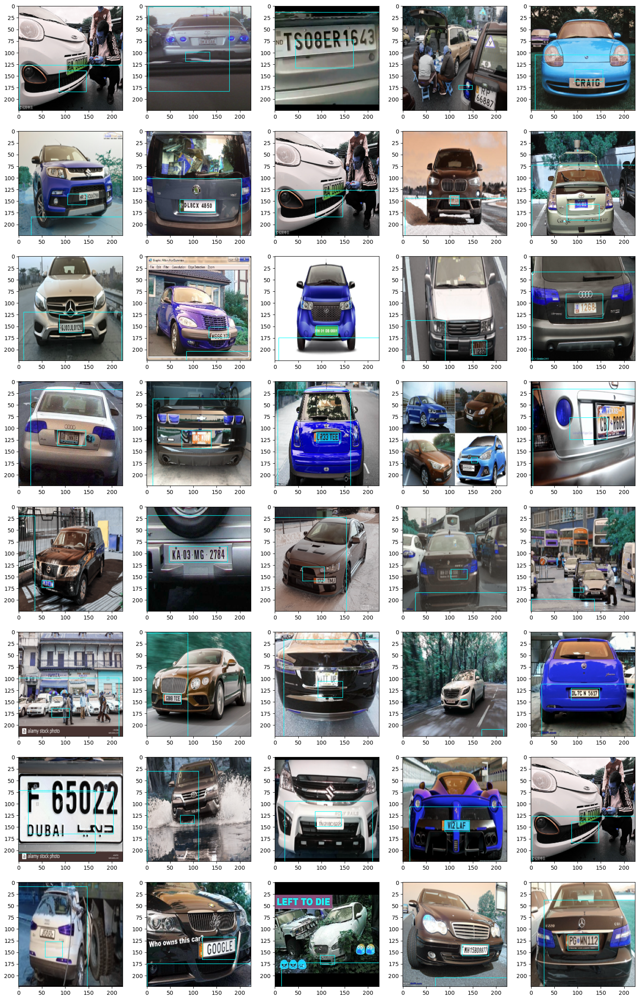

In [32]:
plt.figure(figsize=(20,40))
for i in range(0,40):
    plt.subplot(10,5,i+1)
    ny=ypred[i]*255
    image=cv2.rectangle(Xtest[i],(int(ny[0]),int(ny[1])),(int(ny[2]),int(ny[3])),(0,255,255))
    plt.imshow(image)